In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import numpy as np
import matplotlib.pyplot as plt

from dice_rl_TU_Vienna.plot.continuous import get_logs

from plugins.boyan_chain.continuous.config import *
from plugins.boyan_chain.continuous.load import *
from plugins.boyan_chain.continuous.plot import get_plot_logs

data/boyan_chain/datasets/seed=0_num_experience=100000_N=12_kind=episodic/dataset-ctr.pkl
data/boyan_chain/datasets/seed=0_num_experience=100000_N=12_kind=continuing/dataset-ctr.pkl
data/boyan_chain/datasets/seed=1_num_experience=100000_N=12_kind=episodic/dataset-ctr.pkl
data/boyan_chain/datasets/seed=1_num_experience=100000_N=12_kind=continuing/dataset-ctr.pkl
data/boyan_chain/datasets/seed=2_num_experience=100000_N=12_kind=episodic/dataset-ctr.pkl
data/boyan_chain/datasets/seed=2_num_experience=100000_N=12_kind=continuing/dataset-ctr.pkl
data/boyan_chain/datasets/seed=3_num_experience=100000_N=12_kind=episodic/dataset-ctr.pkl
data/boyan_chain/datasets/seed=3_num_experience=100000_N=12_kind=continuing/dataset-ctr.pkl


# Selected Plots

## Prepare

In [11]:
std_girth = 0.5
alpha = 0.1
markevery = 100

colors_e = ["green", "red", "cyan"]
markers_e = ["3", "4", "+"]

colors_c = colors_e[1:]
markers_c = markers_e[1:]

In [12]:
def plot(logs, tag, analytical, suptitle, title, labels, colors, markers, ylabel, ylim, yscale, ycompute):

    plt.plot()

    if analytical is not None:
        plt.axhline(y=analytical, label="analytical", color="black", linestyle=":")

    for i, (k, v) in enumerate( logs.items() ):

        x = []; y = []
        for seed in seeds:

            x_ = np.array(v[seed]["data"][tag]["steps"])
            y_ = np.array(v[seed]["data"][tag]["values"])
            if ycompute is not None:
                y_ = ycompute(y_)

            x.append(x_)
            y.append(y_)

        ml_x = np.max([ len(x_) for x_ in x ])
        ml_y = np.max([ len(y_) for y_ in y ])
        assert ml_x == ml_y
        ml = np.random.choice([ml_x, ml_y])

        f = False
        for x_ in x:
            if len(x_) == ml_x:
                x = x_; f = True; break
        assert f

        y_mean = np.array([ np.mean([ y_[i] for y_ in y if i < len(y_) ]) for i in range(ml) ])
        y_std  = np.array([ np.std ([ y_[i] for y_ in y if i < len(y_) ]) for i in range(ml) ])

        y_down = y_mean - y_std * std_girth
        y_up   = y_mean + y_std * std_girth

        plt.plot(x, y_mean, label=labels[i], color=colors[i], marker=markers[i], markevery=markevery, alpha=0.75)
        plt.fill_between(x, y_down, y_up, color=colors[i], alpha=alpha)

    plt.grid(linestyle=":")
    plt.legend()

    plt.xlabel("step")
    plt.ylabel(ylabel)

    if yscale == "log":
        plt.yscale("log")

    if yscale == "pi":
        pi_ticks = np.arange(0, 3/8 * np.pi, 1/8 * np.pi)
        pi_labels = [r"$0$", r"$\frac{\pi}{8}$", r"$\frac{\pi}{4}$"]
        plt.yticks(pi_ticks, pi_labels)

    if ylim is not None: plt.ylim(ylim)

    plt.suptitle(suptitle)
    plt.title(title)

    file_name = suptitle.replace(" - ", "_") + "_" + title.replace(", ", "_").replace("$", "").replace("\\", "")
    path = os.path.join(save_dir_images, f"{file_name}.png")
    plt.savefig(path, bbox_inches="tight")

    plt.show()


def plot_pv(logs, weighted, analytical, suptitle, title, labels, colors, markers, ylim=None):
    tag = "pv_w" if weighted else "pv_s"
    ylabel = r"$\rho^\pi$"
    yscale = None
    ycompute = None
    plot(logs, tag, analytical, suptitle, title, labels, colors, markers, ylabel, ylim, yscale, ycompute)


def plot_sdc(logs, suptitle, title, labels, colors, markers):
    tag = "sdc_L2_error"
    analytical = None
    ylabel = r"$\mathbb{E}_D | \hat{w}_{\pi / D} - w_{\pi / D} |^2$"
    ylim = [5e-4, 5e1]
    yscale = "log"
    ycompute = None
    plot(logs, tag, analytical, suptitle, title, labels, colors, markers, ylabel, ylim, yscale, ycompute)


def plot_angles(logs, suptitle, title, labels, colors, markers):
    tag = "cos_angle"
    analytical = None
    ylabel = r"$\measuredangle ( \nabla P^\pi v, \nabla v )$"
    ylim = None
    yscale = "pi"
    ycompute = np.arccos
    plot(logs, tag, analytical, suptitle, title, labels, colors, markers, ylabel, ylim, yscale, ycompute)

## Episodic

In [14]:
gammas_e = [0.1, 0.5, 0.9]
algorithms_e = ["NeuralDualDice", "NeuralGradientDice", "NeuralGenDice"]
hparam_str_evaluation_e = {
    seed: {
        (0.1, "NeuralDualDice"):     f"gam0.1_batchs64_seed{seed}_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_fexp1.5",
        (0.5, "NeuralDualDice"):     f"gam0.5_batchs64_seed{seed}_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_regp0.0_regd0.0_fexp1.5",
        (0.9, "NeuralDualDice"):     f"gam0.9_batchs64_seed{seed}_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_regp0.0_regd0.0_fexp1.5",
        (0.1, "NeuralGradientDice"): f"gam0.1_batchs64_seed{seed}_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg1.0",
        (0.5, "NeuralGradientDice"): f"gam0.5_batchs64_seed{seed}_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg1.0",
        (0.9, "NeuralGradientDice"): f"gam0.9_batchs64_seed{seed}_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg1.0",
        (0.1, "NeuralGenDice"):      f"gam0.1_batchs64_seed{seed}_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg1.0",
        (0.5, "NeuralGenDice"):      f"gam0.5_batchs64_seed{seed}_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg1.0",
        (0.9, "NeuralGenDice"):      f"gam0.9_batchs64_seed{seed}_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg1.0",
    }
        for seed in seeds
}

logs_e = { gamma: { algorithm: {} for algorithm in algorithms_e } for gamma in gammas_e }

for gamma in gammas_e:
    for algorithm in algorithms_e:
        for seed in seeds:
            logs_e[gamma][algorithm][seed] = get_logs(
                log_dir=os.path.join(
                    outputs_dir, hparam_str_policy, hparam_str_dataset[seed]["e"],
                    algorithm,
                    hparam_str_evaluation_e[seed][(gamma, algorithm)],
                )
            )

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732978412.MacBook-Pro-von-Richard.local.58427.6.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=1_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.1_batchs64_seed1_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1733233669.MacBook-Pro-von-Richard.local.42661.0.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=2_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.1_batchs64_seed2_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1733263174.MacBook-Pro-von-Richard.local.49379.0.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=3_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.1_batchs64_seed3_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_fexp1.5/events.out.tfeve

In [15]:
labels_e = algorithms_e

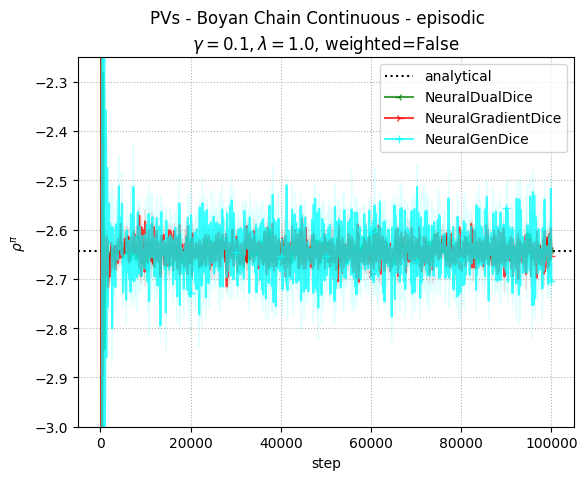

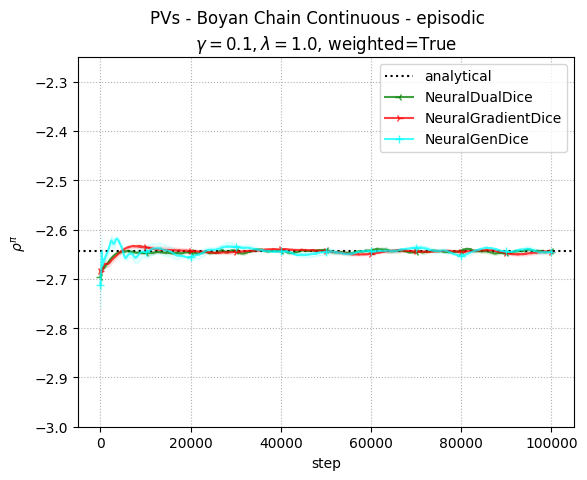

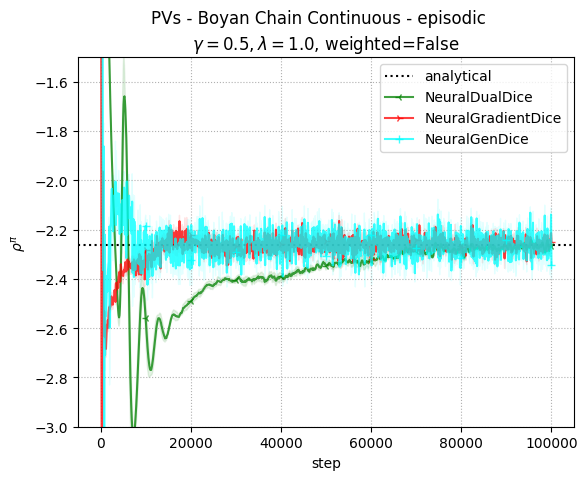

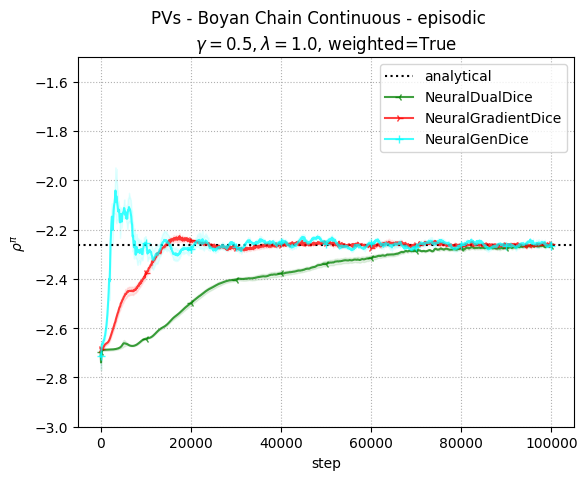

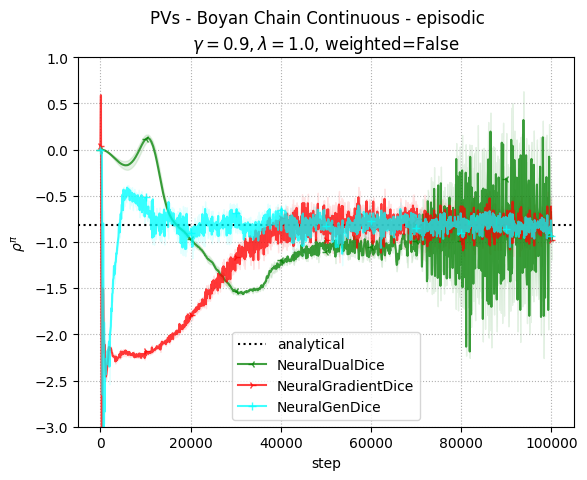

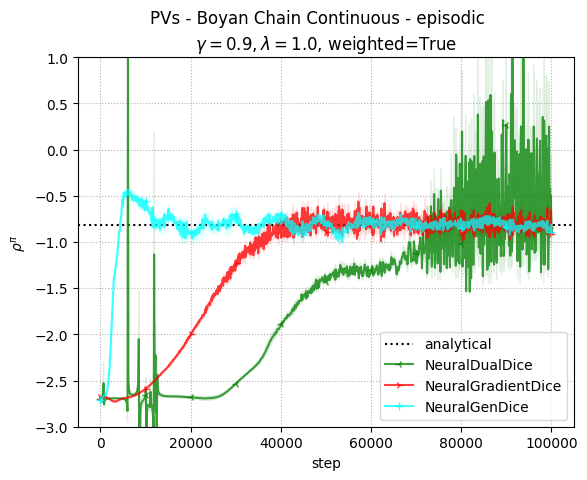

In [29]:
ylims = {
    0.1: (-3, -2.25),
    0.5: (-3, -1.5),
    0.9: (-3, 1),
}

for gamma in gammas_e:
    for weighted in [False, True]:
        plot_pv(
            logs_e[gamma],
            weighted=weighted,
            analytical=analytical_solver["e"].solve(gamma)[0],
            suptitle="PVs - Boyan Chain Continuous - episodic",
            title=r"$\gamma=" + str(gamma) + r", \lambda=1.0$, weighted=" + str(weighted),
            labels=labels_e,
            colors=colors_e,
            markers=markers_e,
            ylim=ylims[gamma],
        )

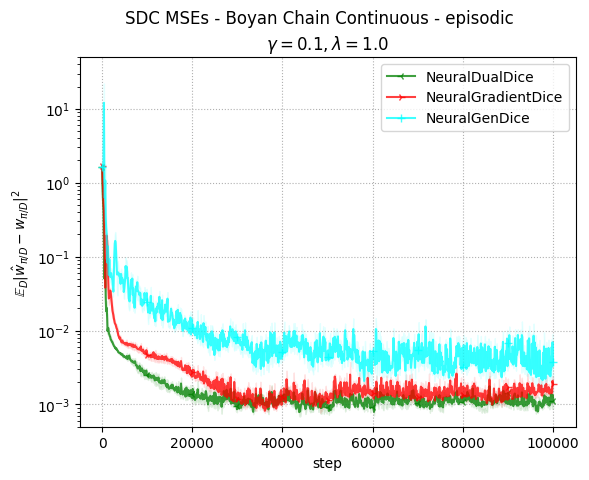

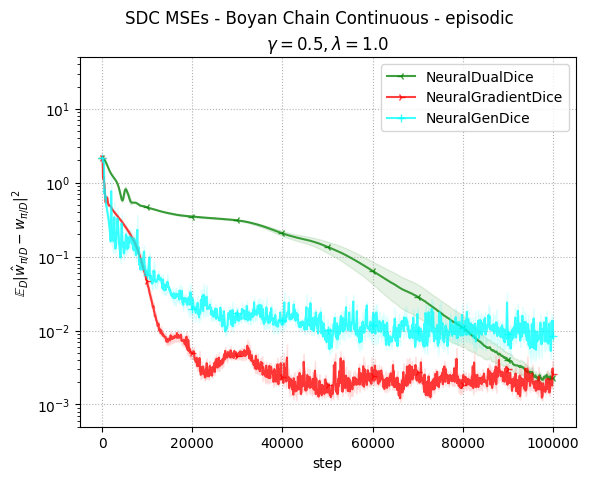

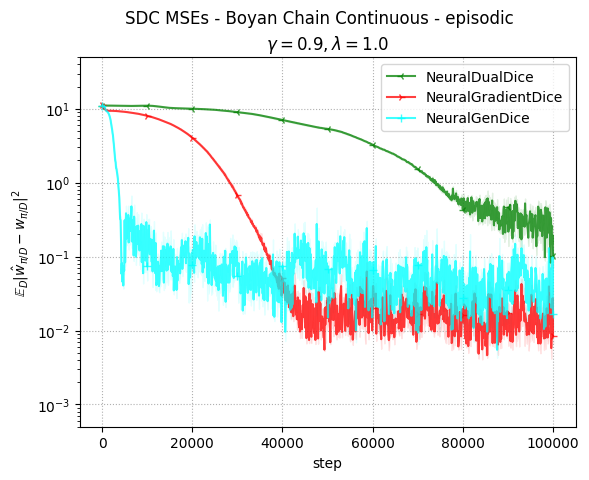

In [17]:
for gamma in gammas_e:
    plot_sdc(
        logs_e[gamma],
        suptitle="SDC MSEs - Boyan Chain Continuous - episodic",
        title=r"$\gamma=" + str(gamma) + r", \lambda=1.0$",
        labels=labels_e,
        colors=colors_e,
        markers=markers_e,
    )

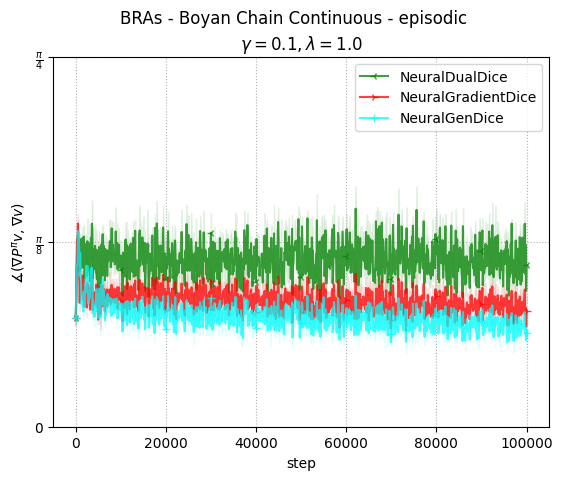

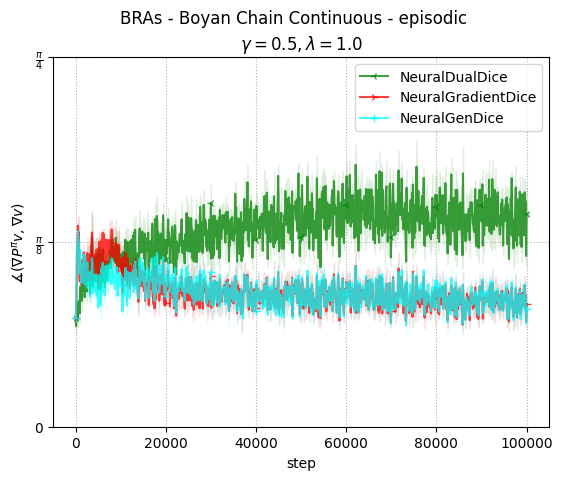

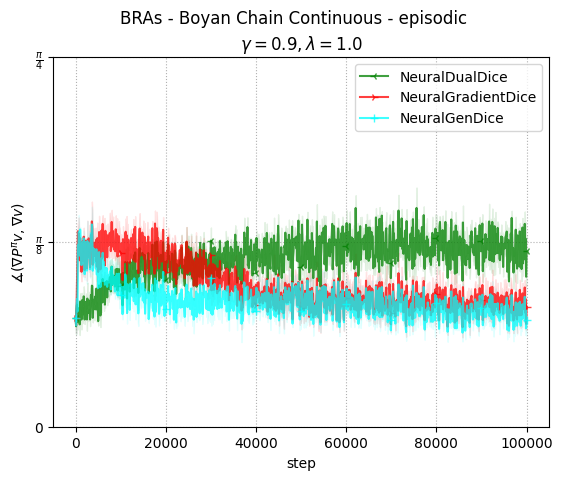

In [18]:
for gamma in gammas_e:
    plot_angles(
        logs_e[gamma],
        suptitle="BRAs - Boyan Chain Continuous - episodic",
        title=r"$\gamma=" + str(gamma) + r", \lambda=1.0$",
        labels=labels_e,
        colors=colors_e,
        markers=markers_e,
    )

## Continuing

In [19]:
gammas_c = [1.0]
algorithms_c = ["NeuralGradientDice", "NeuralGenDice"]
hparam_str_evaluation_c = {
    seed: {
        (1.0, "NeuralGradientDice"): f"gam1.0_batchs64_seed{seed}_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg1.0",
        (1.0, "NeuralGenDice"):      f"gam1.0_batchs64_seed{seed}_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg1.0",
    }
        for seed in seeds
}

logs_c = { gamma: { algorithm: {} for algorithm in algorithms_c } for gamma in gammas_c }

for gamma in gammas_c:
    for algorithm in algorithms_c:
        for seed in seeds:
            logs_c[gamma][algorithm][seed] = get_logs(
                log_dir=os.path.join(
                    outputs_dir, hparam_str_policy, hparam_str_dataset[seed]["c"],
                    algorithm,
                    hparam_str_evaluation_c[seed][(gamma, algorithm)],
                )
            )

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg1.0/events.out.tfevents.1733190462.MacBook-Pro-von-Richard.local.1827.43.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=1_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed1_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg1.0/events.out.tfevents.1733256617.MacBook-Pro-von-Richard.local.42661.10.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=2_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed2_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg1.0/events.out.tfevents.1733286017.MacBook-Pro-von-Richard.local.49379.10.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=3_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed3_hdp(32,)_hdd(32,)_lrp0.0

In [21]:
labels_c = [ algorithm + ", " + r"$\lambda=" + str(lam) + "$" for algorithm, lam in zip(algorithms_c, [1.0, 1.0]) ]

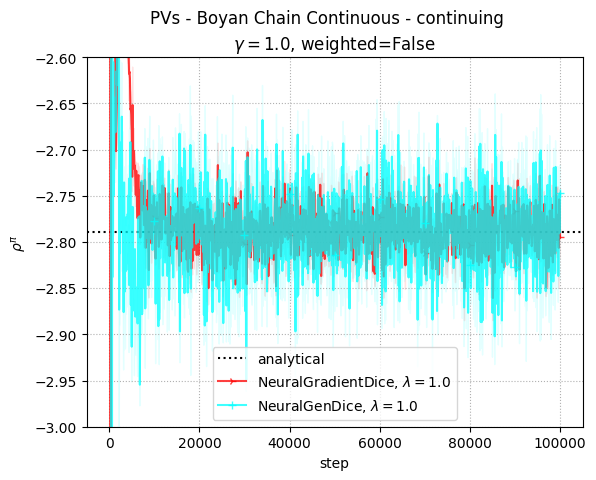

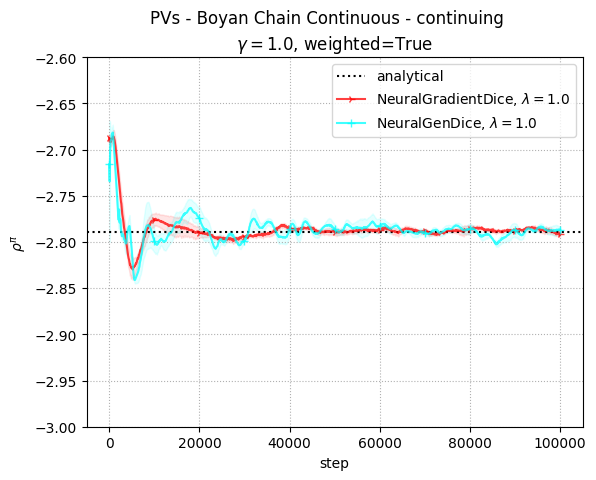

In [ ]:
for gamma in gammas_c:
    for weighted in [False, True]:
        plot_pv(
            logs_c[gamma],
            weighted=weighted,
            analytical=analytical_solver["c"].solve(gamma, primal_dual="dual")[0],
            suptitle="PVs - Boyan Chain Continuous - continuing",
            title="$" + r"\gamma=" + str(gamma) + "$, weighted=" + str(weighted),
            labels=labels_c,
            colors=colors_c,
            markers=markers_c,
            ylim=(-3, -2.6),
        )

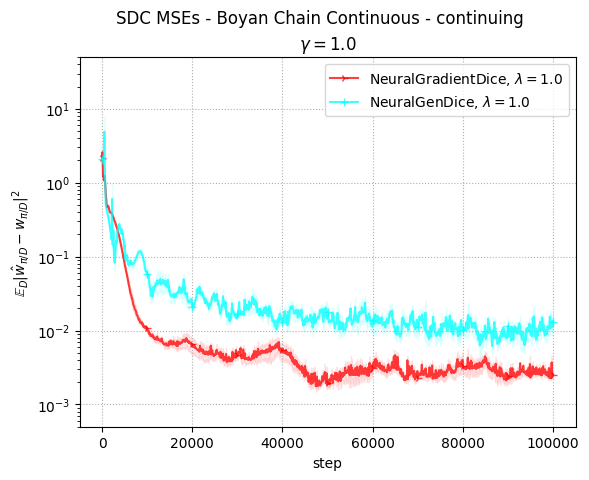

In [23]:
for gamma in gammas_c:
    plot_sdc(
        logs_c[gamma],
        suptitle="SDC MSEs - Boyan Chain Continuous - continuing",
        title="$" + r"\gamma=" + str(gamma) + "$",
        labels=labels_c,
        colors=colors_c,
        markers=markers_c,
    )

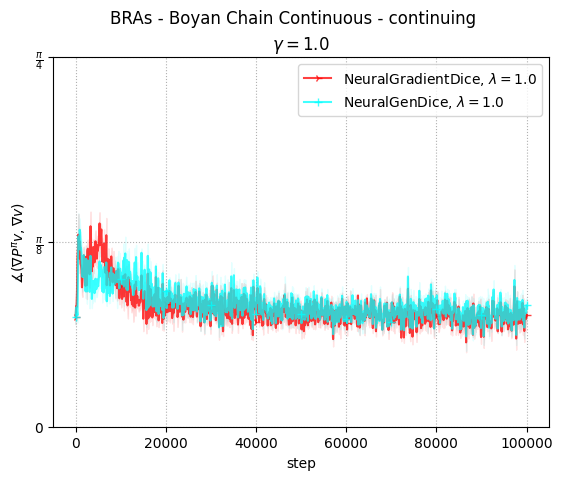

In [24]:
for gamma in gammas_c:
    plot_angles(
        logs_c[gamma],
        suptitle="BRAs - Boyan Chain Continuous - continuing",
        title="$" + r"\gamma=" + str(gamma) + "$",
        labels=labels_c,
        colors=colors_c,
        markers=markers_c,
    )

# All Plots

## DualDICE

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1.0_lrd1.0_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732973830.MacBook-Pro-von-Richard.local.58427.0.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1.0_lrd1.0_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732973830.MacBook-Pro-von-Richard.local.58427.1.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1.0_lrd1.0_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732973831.MacBook-Pro-von-Richard.local.58427.2.v2


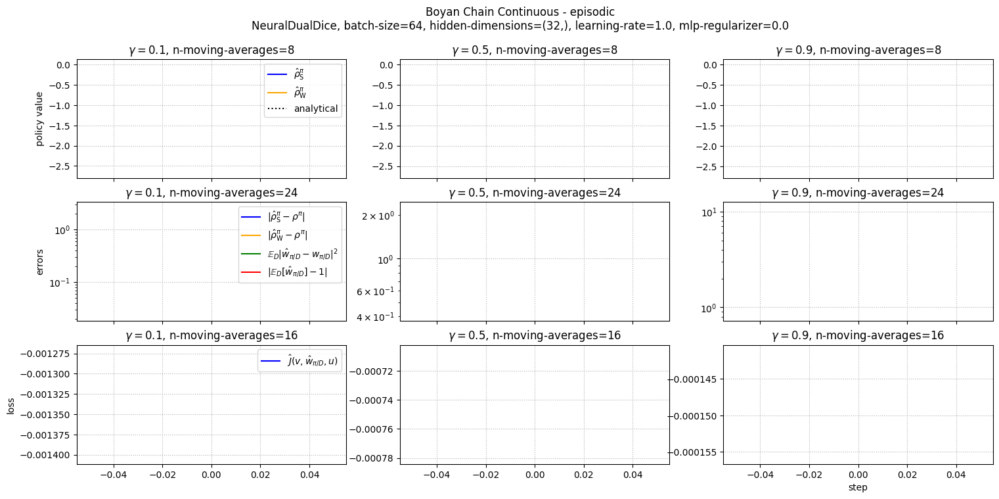

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.1_lrd0.1_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732973831.MacBook-Pro-von-Richard.local.58427.3.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.1_lrd0.1_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732976071.MacBook-Pro-von-Richard.local.58427.4.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.1_lrd0.1_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732978398.MacBook-Pro-von-Richard.local.58427.5.v2


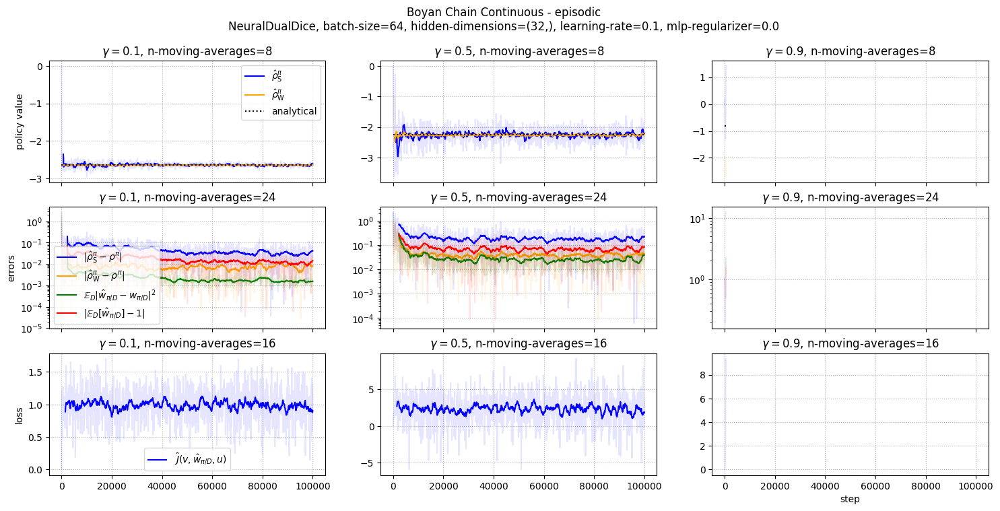

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732978412.MacBook-Pro-von-Richard.local.58427.6.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732980586.MacBook-Pro-von-Richard.local.58427.7.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732982664.MacBook-Pro-von-Richard.local.58427.8.v2


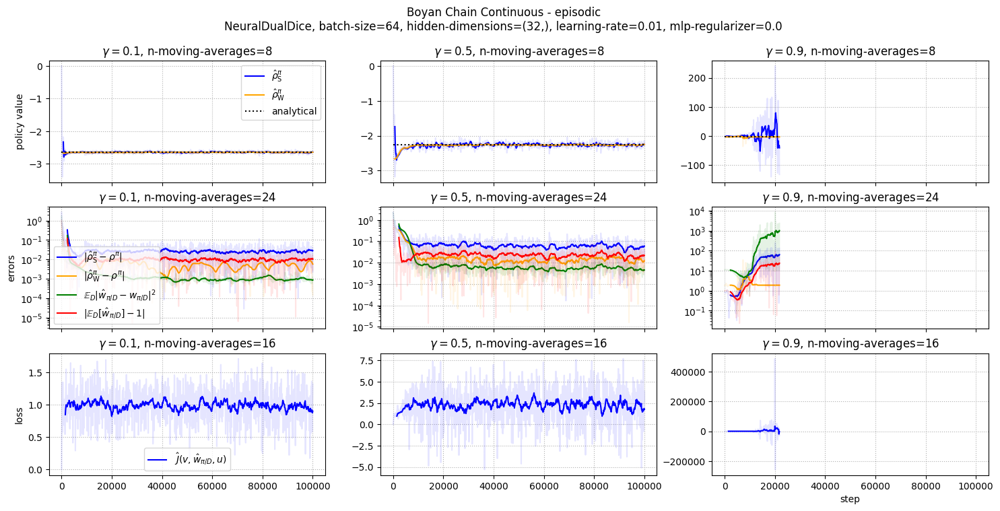

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732983119.MacBook-Pro-von-Richard.local.58427.9.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732985177.MacBook-Pro-von-Richard.local.58427.10.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732987305.MacBook-Pro-von-Richard.local.58427.11.v2


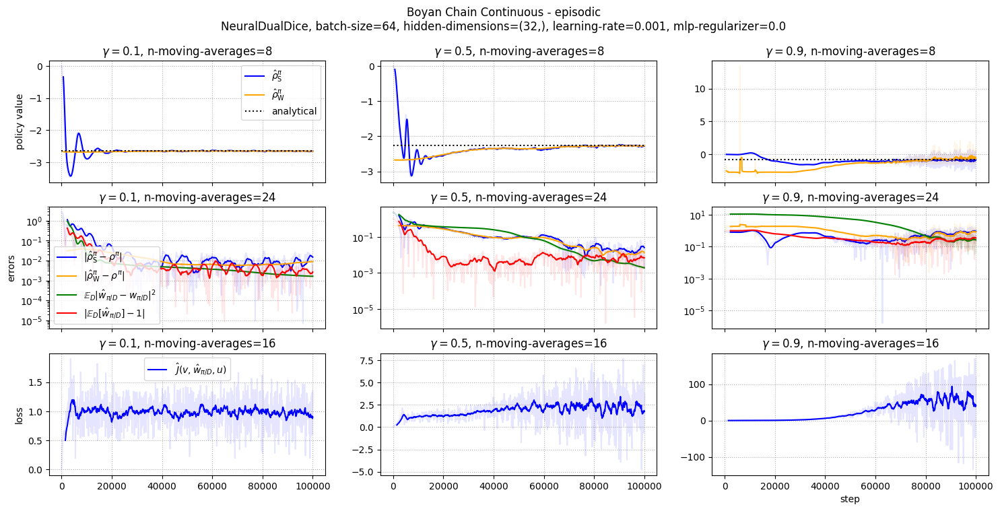

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.0001_lrd0.0001_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732989389.MacBook-Pro-von-Richard.local.58427.12.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.0001_lrd0.0001_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732991432.MacBook-Pro-von-Richard.local.58427.13.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.0001_lrd0.0001_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732993473.MacBook-Pro-von-Richard.local.58427.14.v2


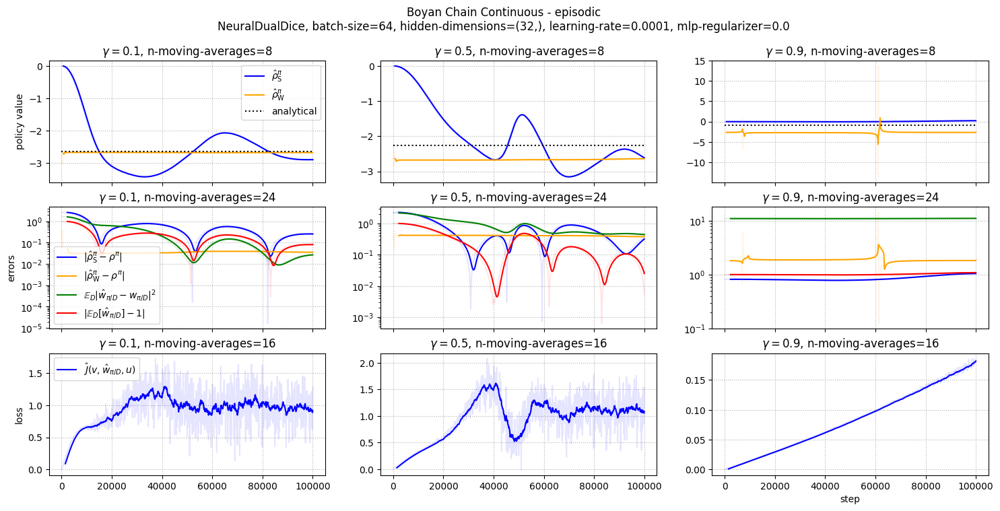

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1e-05_lrd1e-05_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732995560.MacBook-Pro-von-Richard.local.58427.15.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1e-05_lrd1e-05_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732997639.MacBook-Pro-von-Richard.local.58427.16.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralDualDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1e-05_lrd1e-05_regp0.0_regd0.0_fexp1.5/events.out.tfevents.1732999700.MacBook-Pro-von-Richard.local.58427.17.v2


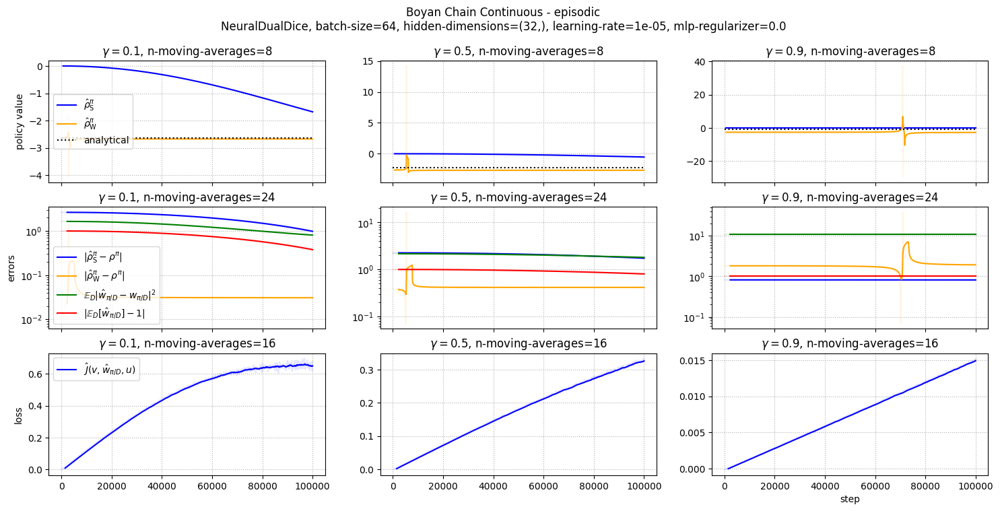

In [8]:
for lr in [1e0, 1e-1, 1e-2, 1e-3, 1e-4, 1e-5]:
    get_plot_logs(
        analytical_solver["e"],
        #
        outputs_dir,
        hparam_str_policy, hparam_str_dataset[0]["e"],
        "NeuralDualDice", hparam_str_evaluation=[
            f"gam{gam}_batchs64_seed0_hdp(32,)_hdd(32,)_lrp{lr}_lrd{lr}_regp0.0_regd0.0_fexp1.5"
                for gam in [0.1, 0.5, 0.9]
        ],
        #
        n_ma_1=8, n_ma_2=24, n_ma_3=16,
        #
        save_dir=save_dir_images,
    )

## GenDICE

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1.0_lrd1.0_regp0.0_regd0.0_nlr1.0_nreg1.0/events.out.tfevents.1733001773.MacBook-Pro-von-Richard.local.58427.18.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1.0_lrd1.0_regp0.0_regd0.0_nlr1.0_nreg1.0/events.out.tfevents.1733001774.MacBook-Pro-von-Richard.local.58427.19.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1.0_lrd1.0_regp0.0_regd0.0_nlr1.0_nreg1.0/events.out.tfevents.1733001775.MacBook-Pro-von-Richard.local.58427.20.v2


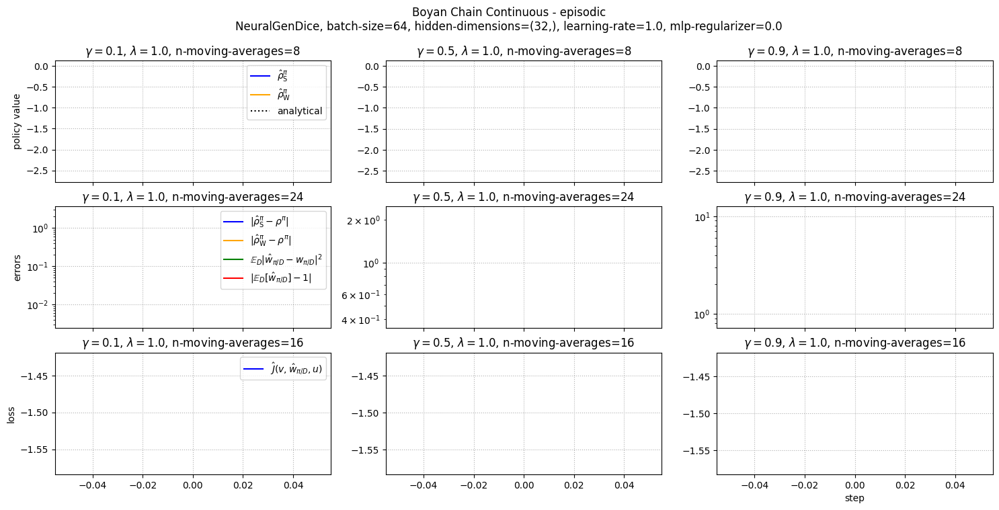

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.1_lrd0.1_regp0.0_regd0.0_nlr0.1_nreg1.0/events.out.tfevents.1733001775.MacBook-Pro-von-Richard.local.58427.21.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.1_lrd0.1_regp0.0_regd0.0_nlr0.1_nreg1.0/events.out.tfevents.1733001776.MacBook-Pro-von-Richard.local.58427.22.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.1_lrd0.1_regp0.0_regd0.0_nlr0.1_nreg1.0/events.out.tfevents.1733001777.MacBook-Pro-von-Richard.local.58427.23.v2


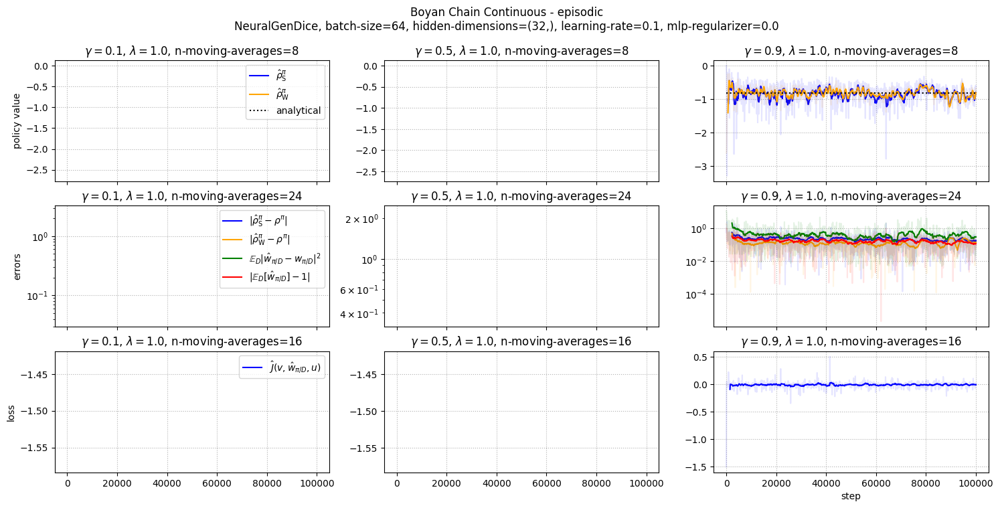

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg1.0/events.out.tfevents.1733004222.MacBook-Pro-von-Richard.local.58427.24.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg1.0/events.out.tfevents.1733006658.MacBook-Pro-von-Richard.local.58427.25.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg1.0/events.out.tfevents.1733009069.MacBook-Pro-von-Richard.local.58427.26.v2


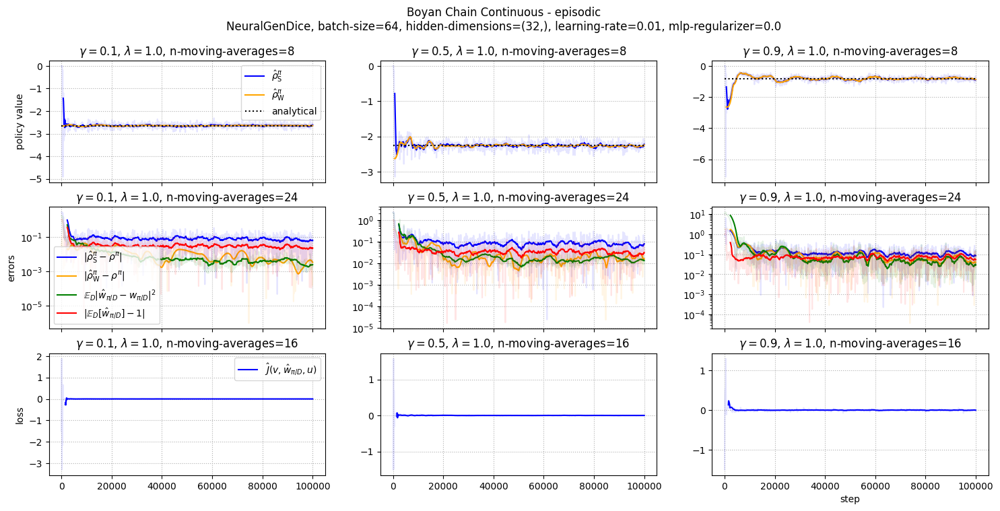

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_regp0.0_regd0.0_nlr0.001_nreg1.0/events.out.tfevents.1733011484.MacBook-Pro-von-Richard.local.58427.27.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_regp0.0_regd0.0_nlr0.001_nreg1.0/events.out.tfevents.1733013915.MacBook-Pro-von-Richard.local.58427.28.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_regp0.0_regd0.0_nlr0.001_nreg1.0/events.out.tfevents.1733016353.MacBook-Pro-von-Richard.local.58427.29.v2


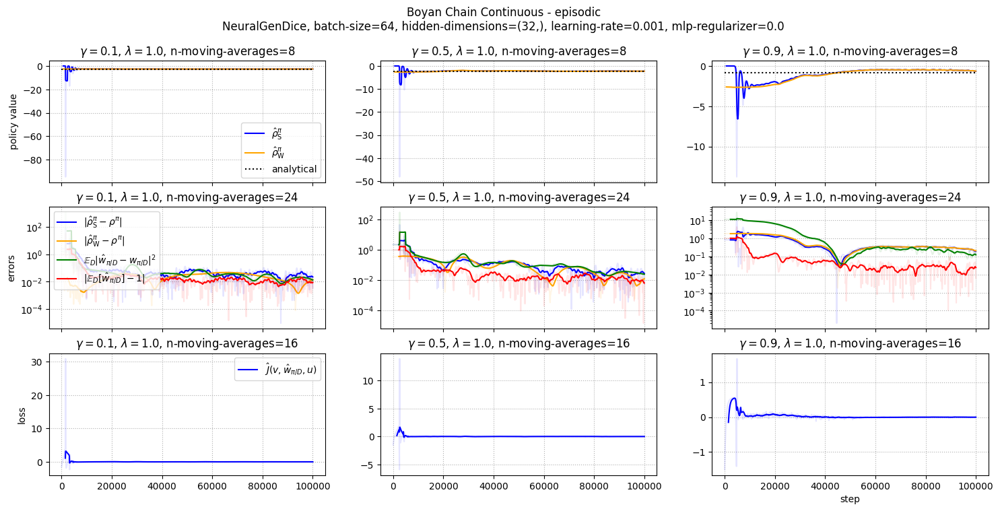

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.0001_lrd0.0001_regp0.0_regd0.0_nlr0.0001_nreg1.0/events.out.tfevents.1733018748.MacBook-Pro-von-Richard.local.58427.30.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.0001_lrd0.0001_regp0.0_regd0.0_nlr0.0001_nreg1.0/events.out.tfevents.1733021160.MacBook-Pro-von-Richard.local.58427.31.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.0001_lrd0.0001_regp0.0_regd0.0_nlr0.0001_nreg1.0/events.out.tfevents.1733023578.MacBook-Pro-von-Richard.local.58427.32.v2


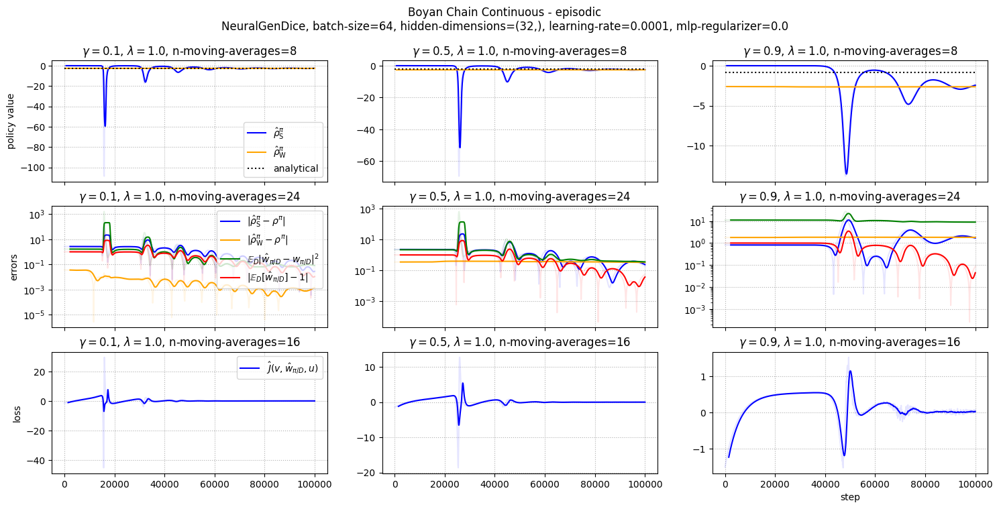

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1e-05_lrd1e-05_regp0.0_regd0.0_nlr1e-05_nreg1.0/events.out.tfevents.1733026005.MacBook-Pro-von-Richard.local.58427.33.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1e-05_lrd1e-05_regp0.0_regd0.0_nlr1e-05_nreg1.0/events.out.tfevents.1733028445.MacBook-Pro-von-Richard.local.58427.34.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGenDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1e-05_lrd1e-05_regp0.0_regd0.0_nlr1e-05_nreg1.0/events.out.tfevents.1733030855.MacBook-Pro-von-Richard.local.58427.35.v2


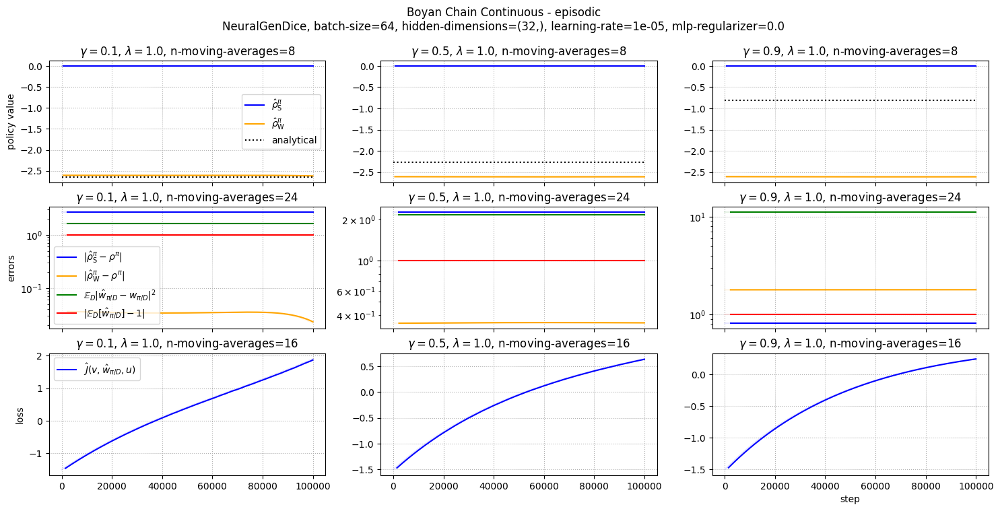

In [7]:
for lr in [1e0, 1e-1, 1e-2, 1e-3, 1e-4, 1e-5]:
    get_plot_logs(
        analytical_solver["e"],
        #
        outputs_dir,
        hparam_str_policy, hparam_str_dataset[0]["e"],
        "NeuralGenDice", hparam_str_evaluation=[
            f"gam{gam}_batchs64_seed0_hdp(32,)_hdd(32,)_lrp{lr}_lrd{lr}_regp0.0_regd0.0_nlr{lr}_nreg1.0"
                for gam in [0.1, 0.5, 0.9]
        ],
        #
        n_ma_1=8, n_ma_2=24, n_ma_3=16,
        #
        save_dir=save_dir_images,
    )

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1.0_lrd1.0_regp0.0_regd0.0_nlr1.0_nreg0.0/events.out.tfevents.1733097137.MacBook-Pro-von-Richard.local.1827.0.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1.0_lrd1.0_regp0.0_regd0.0_nlr1.0_nreg0.1/events.out.tfevents.1733099547.MacBook-Pro-von-Richard.local.1827.1.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1.0_lrd1.0_regp0.0_regd0.0_nlr1.0_nreg0.5/events.out.tfevents.1733099549.MacBook-Pro-von-Richard.local.1827.2.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1.0_lrd1.0_regp0.0_regd0.0_nlr1.0_nre

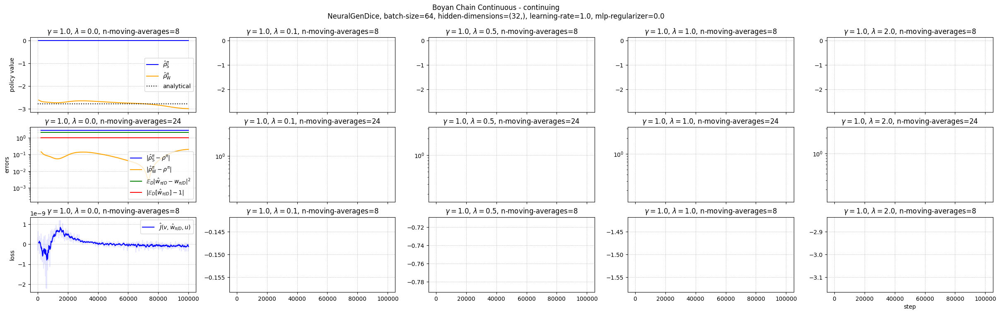

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.1_lrd0.1_regp0.0_regd0.0_nlr0.1_nreg0.0/events.out.tfevents.1733099551.MacBook-Pro-von-Richard.local.1827.5.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.1_lrd0.1_regp0.0_regd0.0_nlr0.1_nreg0.1/events.out.tfevents.1733102048.MacBook-Pro-von-Richard.local.1827.6.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.1_lrd0.1_regp0.0_regd0.0_nlr0.1_nreg0.5/events.out.tfevents.1733104510.MacBook-Pro-von-Richard.local.1827.7.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.1_lrd0.1_regp0.0_regd0.0_nlr0.1_nre

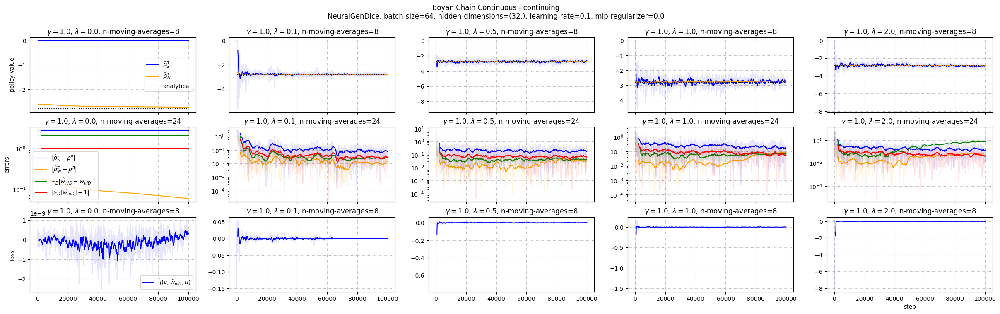

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg0.0/events.out.tfevents.1733111863.MacBook-Pro-von-Richard.local.1827.10.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg0.1/events.out.tfevents.1733114317.MacBook-Pro-von-Richard.local.1827.11.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg0.5/events.out.tfevents.1733116759.MacBook-Pro-von-Richard.local.1827.12.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd

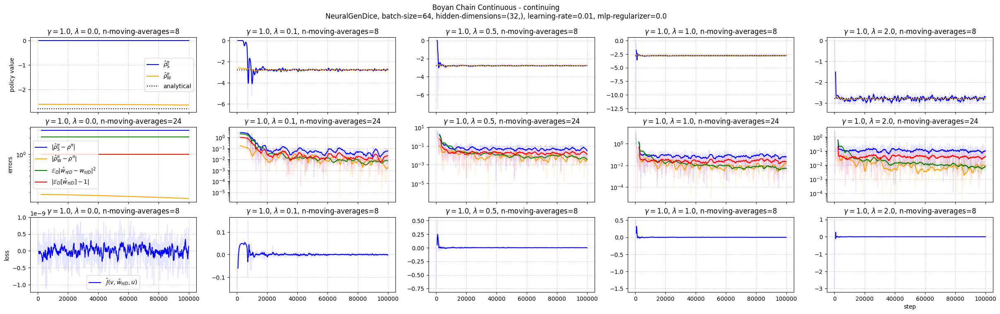

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_regp0.0_regd0.0_nlr0.001_nreg0.0/events.out.tfevents.1733124080.MacBook-Pro-von-Richard.local.1827.15.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_regp0.0_regd0.0_nlr0.001_nreg0.1/events.out.tfevents.1733126532.MacBook-Pro-von-Richard.local.1827.16.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_regp0.0_regd0.0_nlr0.001_nreg0.5/events.out.tfevents.1733128998.MacBook-Pro-von-Richard.local.1827.17.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_r

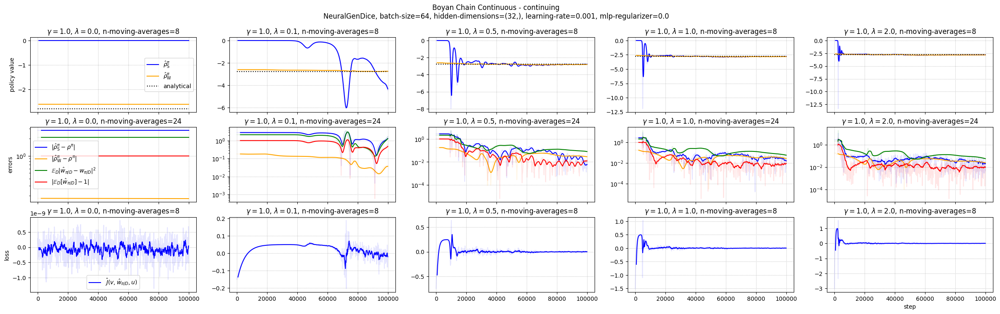

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.0001_lrd0.0001_regp0.0_regd0.0_nlr0.0001_nreg0.0/events.out.tfevents.1733136352.MacBook-Pro-von-Richard.local.1827.20.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.0001_lrd0.0001_regp0.0_regd0.0_nlr0.0001_nreg0.1/events.out.tfevents.1733138807.MacBook-Pro-von-Richard.local.1827.21.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.0001_lrd0.0001_regp0.0_regd0.0_nlr0.0001_nreg0.5/events.out.tfevents.1733141251.MacBook-Pro-von-Richard.local.1827.22.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.0001_

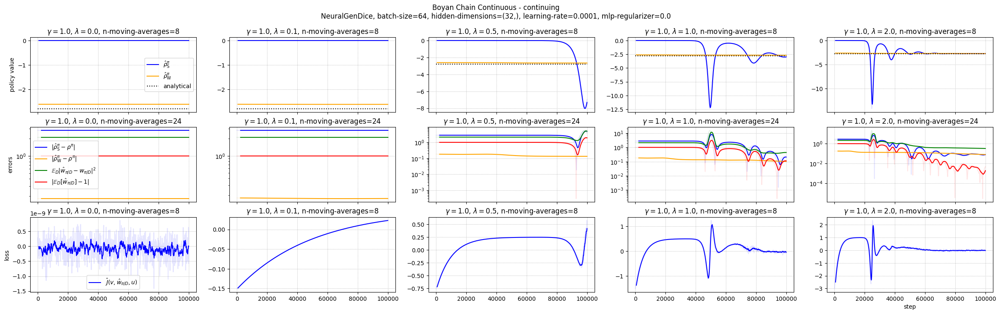

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1e-05_lrd1e-05_regp0.0_regd0.0_nlr1e-05_nreg0.0/events.out.tfevents.1733148547.MacBook-Pro-von-Richard.local.1827.25.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1e-05_lrd1e-05_regp0.0_regd0.0_nlr1e-05_nreg0.1/events.out.tfevents.1733150968.MacBook-Pro-von-Richard.local.1827.26.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1e-05_lrd1e-05_regp0.0_regd0.0_nlr1e-05_nreg0.5/events.out.tfevents.1733153406.MacBook-Pro-von-Richard.local.1827.27.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGenDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1e-05_lrd1e-05_r

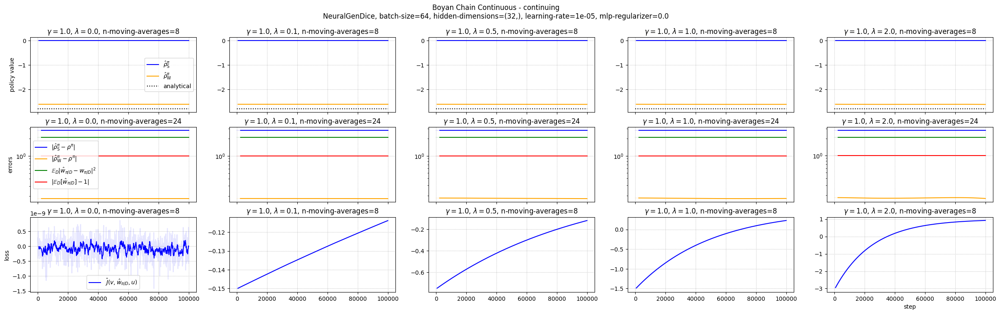

In [6]:
for lr in [1e0, 1e-1, 1e-2, 1e-3, 1e-4, 1e-5]:
    get_plot_logs(
        analytical_solver["c"],
        #
        outputs_dir,
        hparam_str_policy, hparam_str_dataset[0]["c"],
        "NeuralGenDice", hparam_str_evaluation=[
            f"gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp{lr}_lrd{lr}_regp0.0_regd0.0_nlr{lr}_nreg{nreg}"
                for nreg in [0.0, 0.1, 0.5, 1.0, 2.0]
        ],
        n_ma_1=8, n_ma_2=24, n_ma_3=8,
        #
        save_dir=save_dir_images,
    )

## GradientDICE

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1.0_lrd1.0_regp0.0_regd0.0_nlr1.0_nreg1.0/events.out.tfevents.1733033296.MacBook-Pro-von-Richard.local.58427.36.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1.0_lrd1.0_regp0.0_regd0.0_nlr1.0_nreg1.0/events.out.tfevents.1733033300.MacBook-Pro-von-Richard.local.58427.37.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1.0_lrd1.0_regp0.0_regd0.0_nlr1.0_nreg1.0/events.out.tfevents.1733033310.MacBook-Pro-von-Richard.local.58427.38.v2


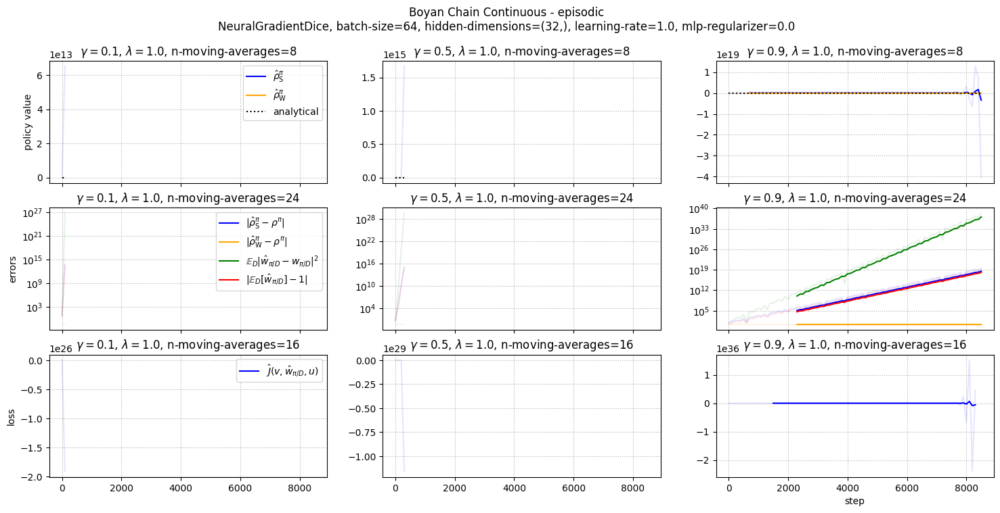

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.1_lrd0.1_regp0.0_regd0.0_nlr0.1_nreg1.0/events.out.tfevents.1733033518.MacBook-Pro-von-Richard.local.58427.39.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.1_lrd0.1_regp0.0_regd0.0_nlr0.1_nreg1.0/events.out.tfevents.1733035936.MacBook-Pro-von-Richard.local.58427.40.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.1_lrd0.1_regp0.0_regd0.0_nlr0.1_nreg1.0/events.out.tfevents.1733038378.MacBook-Pro-von-Richard.local.58427.41.v2


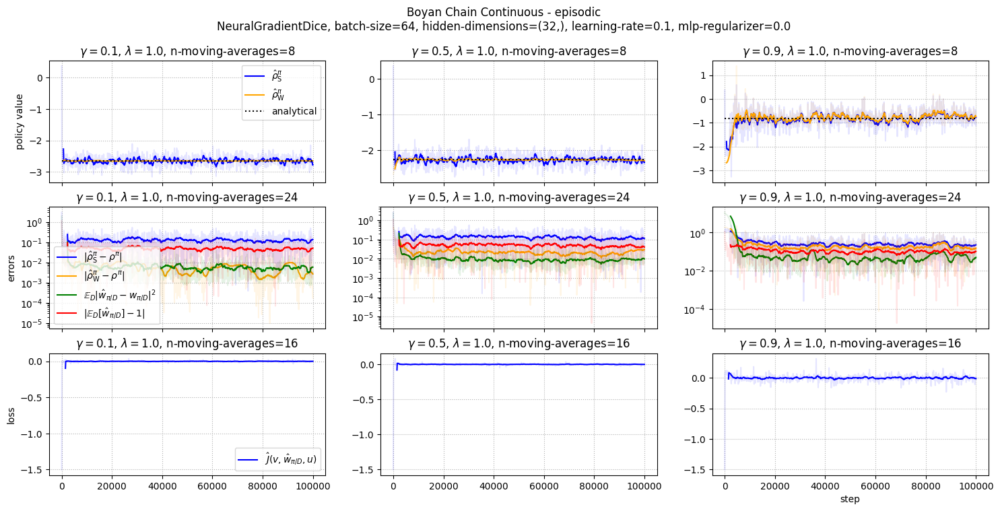

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg1.0/events.out.tfevents.1733040800.MacBook-Pro-von-Richard.local.58427.42.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg1.0/events.out.tfevents.1733043242.MacBook-Pro-von-Richard.local.58427.43.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg1.0/events.out.tfevents.1733045649.MacBook-Pro-von-Richard.local.58427.44.v2


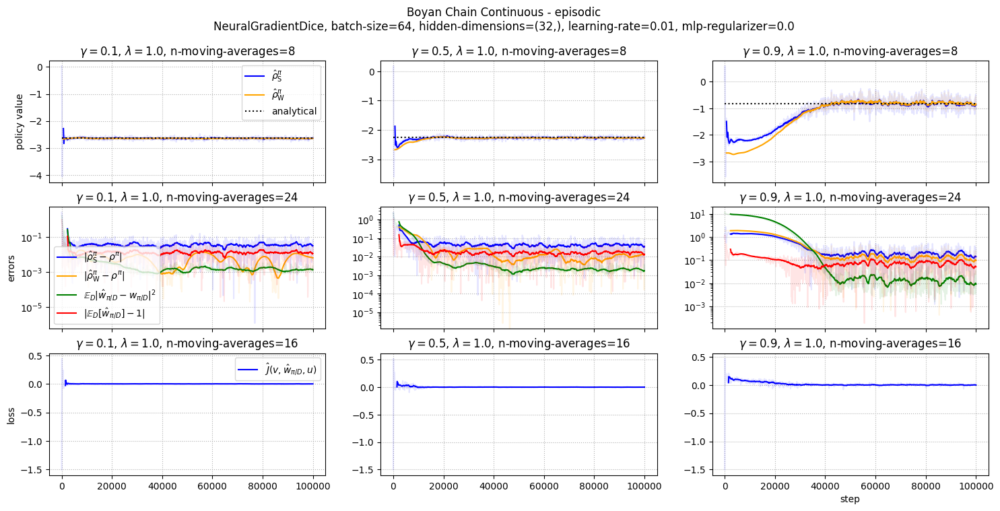

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_regp0.0_regd0.0_nlr0.001_nreg1.0/events.out.tfevents.1733048095.MacBook-Pro-von-Richard.local.58427.45.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_regp0.0_regd0.0_nlr0.001_nreg1.0/events.out.tfevents.1733050522.MacBook-Pro-von-Richard.local.58427.46.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_regp0.0_regd0.0_nlr0.001_nreg1.0/events.out.tfevents.1733052946.MacBook-Pro-von-Richard.local.58427.47.v2


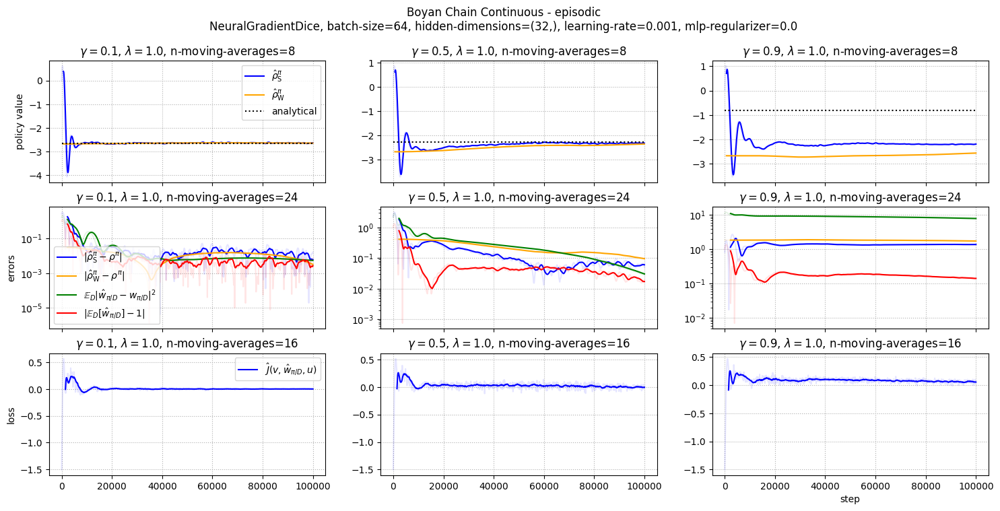

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.0001_lrd0.0001_regp0.0_regd0.0_nlr0.0001_nreg1.0/events.out.tfevents.1733055373.MacBook-Pro-von-Richard.local.58427.48.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.0001_lrd0.0001_regp0.0_regd0.0_nlr0.0001_nreg1.0/events.out.tfevents.1733057796.MacBook-Pro-von-Richard.local.58427.49.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.0001_lrd0.0001_regp0.0_regd0.0_nlr0.0001_nreg1.0/events.out.tfevents.1733060235.MacBook-Pro-von-Richard.local.58427.50.v2


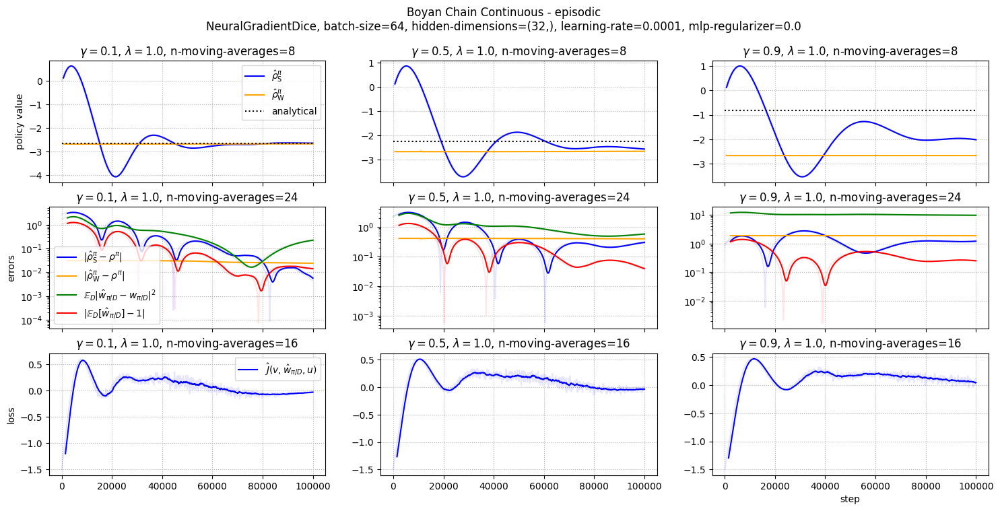

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.1_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1e-05_lrd1e-05_regp0.0_regd0.0_nlr1e-05_nreg1.0/events.out.tfevents.1733062719.MacBook-Pro-von-Richard.local.58427.51.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.5_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1e-05_lrd1e-05_regp0.0_regd0.0_nlr1e-05_nreg1.0/events.out.tfevents.1733065284.MacBook-Pro-von-Richard.local.58427.52.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=episodic/NeuralGradientDice/gam0.9_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1e-05_lrd1e-05_regp0.0_regd0.0_nlr1e-05_nreg1.0/events.out.tfevents.1733067744.MacBook-Pro-von-Richard.local.58427.53.v2


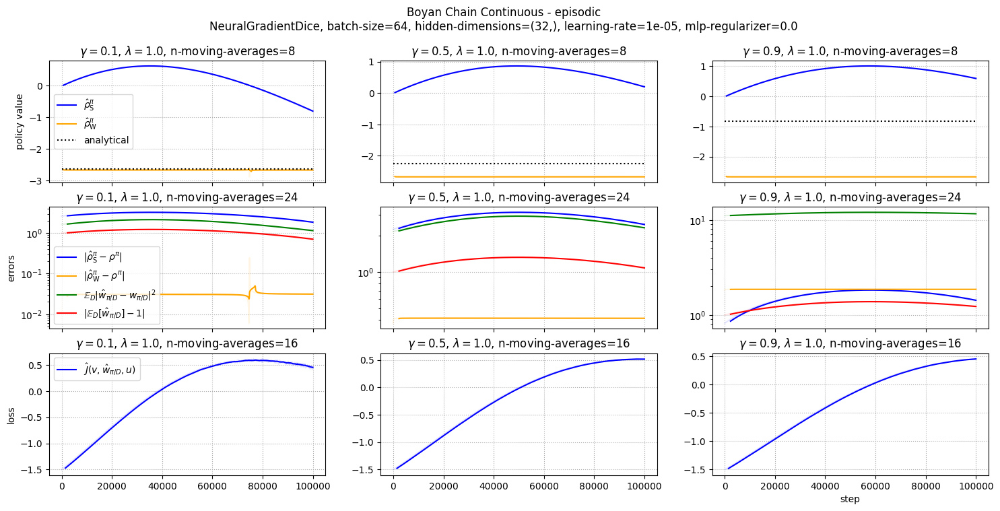

In [9]:
for lr in [1e0, 1e-1, 1e-2, 1e-3, 1e-4, 1e-5]:
    get_plot_logs(
        analytical_solver["e"],
        #
        outputs_dir,
        hparam_str_policy, hparam_str_dataset[0]["e"],
        "NeuralGradientDice", hparam_str_evaluation=[
            f"gam{gam}_batchs64_seed0_hdp(32,)_hdd(32,)_lrp{lr}_lrd{lr}_regp0.0_regd0.0_nlr{lr}_nreg1.0"
                for gam in [0.1, 0.5, 0.9]
        ],
        #
        n_ma_1=8, n_ma_2=24, n_ma_3=16,
        #
        save_dir=save_dir_images,
    )

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1.0_lrd1.0_regp0.0_regd0.0_nlr1.0_nreg0.0/events.out.tfevents.1733160719.MacBook-Pro-von-Richard.local.1827.30.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1.0_lrd1.0_regp0.0_regd0.0_nlr1.0_nreg0.1/events.out.tfevents.1733163177.MacBook-Pro-von-Richard.local.1827.31.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1.0_lrd1.0_regp0.0_regd0.0_nlr1.0_nreg0.5/events.out.tfevents.1733165626.MacBook-Pro-von-Richard.local.1827.32.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1.0_lrd1.0_reg

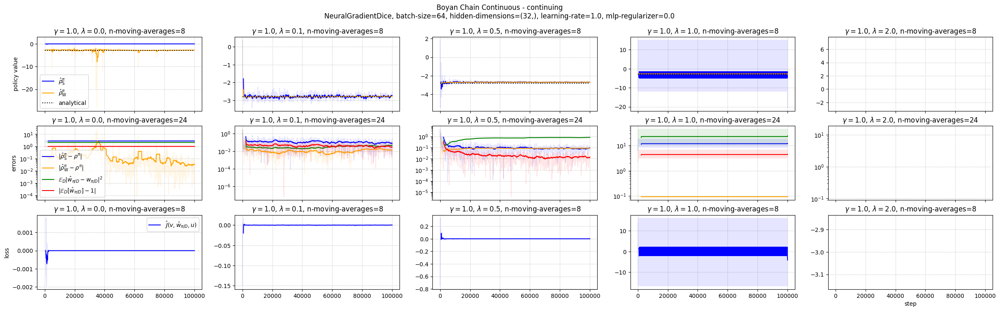

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.1_lrd0.1_regp0.0_regd0.0_nlr0.1_nreg0.0/events.out.tfevents.1733170566.MacBook-Pro-von-Richard.local.1827.35.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.1_lrd0.1_regp0.0_regd0.0_nlr0.1_nreg0.1/events.out.tfevents.1733173045.MacBook-Pro-von-Richard.local.1827.36.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.1_lrd0.1_regp0.0_regd0.0_nlr0.1_nreg0.5/events.out.tfevents.1733175533.MacBook-Pro-von-Richard.local.1827.37.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.1_lrd0.1_reg

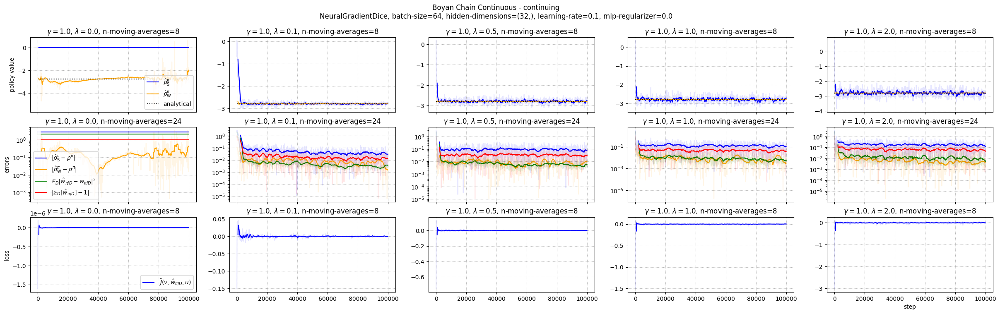

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg0.0/events.out.tfevents.1733183068.MacBook-Pro-von-Richard.local.1827.40.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg0.1/events.out.tfevents.1733185508.MacBook-Pro-von-Richard.local.1827.41.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_lrd0.01_regp0.0_regd0.0_nlr0.01_nreg0.5/events.out.tfevents.1733187996.MacBook-Pro-von-Richard.local.1827.42.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.01_

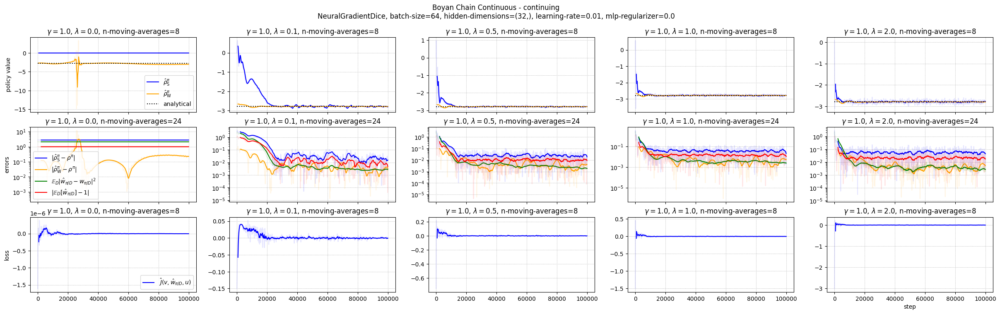

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_regp0.0_regd0.0_nlr0.001_nreg0.0/events.out.tfevents.1733195414.MacBook-Pro-von-Richard.local.1827.45.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_regp0.0_regd0.0_nlr0.001_nreg0.1/events.out.tfevents.1733197889.MacBook-Pro-von-Richard.local.1827.46.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.001_lrd0.001_regp0.0_regd0.0_nlr0.001_nreg0.5/events.out.tfevents.1733200345.MacBook-Pro-von-Richard.local.1827.47.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)

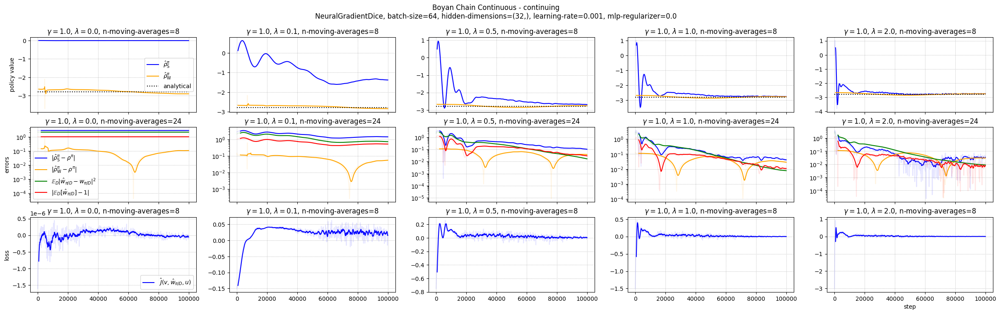

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.0001_lrd0.0001_regp0.0_regd0.0_nlr0.0001_nreg0.0/events.out.tfevents.1733207696.MacBook-Pro-von-Richard.local.1827.50.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.0001_lrd0.0001_regp0.0_regd0.0_nlr0.0001_nreg0.1/events.out.tfevents.1733210129.MacBook-Pro-von-Richard.local.1827.51.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp0.0001_lrd0.0001_regp0.0_regd0.0_nlr0.0001_nreg0.5/events.out.tfevents.1733212596.MacBook-Pro-von-Richard.local.1827.52.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)

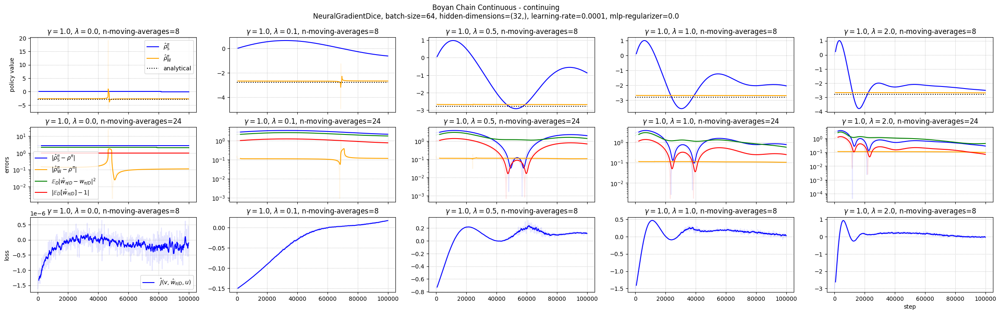

Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1e-05_lrd1e-05_regp0.0_regd0.0_nlr1e-05_nreg0.0/events.out.tfevents.1733220014.MacBook-Pro-von-Richard.local.1827.55.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1e-05_lrd1e-05_regp0.0_regd0.0_nlr1e-05_nreg0.1/events.out.tfevents.1733222483.MacBook-Pro-von-Richard.local.1827.56.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp1e-05_lrd1e-05_regp0.0_regd0.0_nlr1e-05_nreg0.5/events.out.tfevents.1733224967.MacBook-Pro-von-Richard.local.1827.57.v2
Getting log: data/boyan_chain/outputs/p=0.1_N=12/seed=0_num_experience=100000_N=12_kind=continuing/NeuralGradientDice/gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)

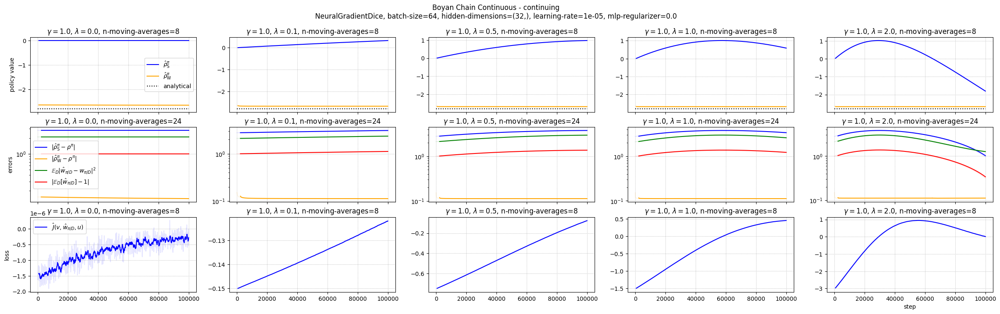

In [10]:
for lr in [1e0, 1e-1, 1e-2, 1e-3, 1e-4, 1e-5]:
    get_plot_logs(
        analytical_solver["c"],
        #
        outputs_dir,
        hparam_str_policy, hparam_str_dataset[0]["c"],
        "NeuralGradientDice", hparam_str_evaluation=[
            f"gam1.0_batchs64_seed0_hdp(32,)_hdd(32,)_lrp{lr}_lrd{lr}_regp0.0_regd0.0_nlr{lr}_nreg{nreg}"
                for nreg in [0.0, 0.1, 0.5, 1.0, 2.0]
        ],
        n_ma_1=8, n_ma_2=24, n_ma_3=8,
        #
        save_dir=save_dir_images,
    )